# MPSR Simulation module 

_Goal_: simualte realistic DNA methylation data (based on a multivariate mixture of normal distributions) 

Two approaches:
 - **COPULAS**
 - **CHOLESKY DECOMPOSITION**



In [1]:
import numpy as np
import pandas as pd

from scipy.stats import norm
from scipy.stats import beta
from scipy.stats import gamma
from scipy.stats import rv_continuous

import plotly.express as px
from plotly.subplots import make_subplots

from IPython.display import display_html
from functools import reduce

/var/folders/f9/fknlq25n23l74zmhg8zbckx80000gn/T/ipykernel_95200/2376763270.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
rseed = 3108
np.random.seed(seed=rseed)

## 1. Copula approach
A *copula* is a probability model that represents a multivariate uniform distribution, which describes the association between multiple variables. The key idea is that marginal distributions can be modeled independently from the joint distribution. 

Copulas are most often applied in finance, where returns distributions are often non-normal, so their interdependence cannot be well described by correlation coefficients. 

A copula-based modeling approach consists of two steps:

1. Model each variable independently, transforming them into uniform distributions using the probability integral transform
2. Model the relationship between the transformed variables using the copula function


In [3]:
# Utilities 

def minmax_norm(cpg):
    """ Normalise values between 0 and 1.
    """
    norm_cpg = (cpg - cpg.min()) / (cpg.max() - cpg.min())
    return(norm_cpg)

def pretty_scat(plot_list, plot_grid, figure_title, data):
    """ Draw a set of (interactive) scatterplots with histogram margins.
    Input:
        plot_list: list of tuples with (x,y) variables to plot ( = column names in data)
        plot_grid: tuple of (n_rows, n_cols) for arranging subplots
        figure_title: str 
        data: pandas.DataFrame 
    """
    nrows, ncols = plot_grid

    obs_cov = data.corr(method='spearman').round(2)
    quant_pos = data.quantile(1)
    
    fig = make_subplots(rows=nrows*3, cols=ncols*3, row_heights=[0.05, 0.2, 1]*nrows, column_widths=[1, 0.2, 0.05]*ncols)

    for i, vars in enumerate(plot_list):
       
        x, y = vars

        # single scatteplot + histogram margins
        p = px.scatter(data, x = x, y= y,
                       trendline='ols', trendline_color_override='DeepPink', marginal_x='histogram', marginal_y='histogram').data

        # Position in the figure # TODO: generalise- only 2 rows considered
        r = 3 if i < ncols else 6
        c = i*3+1 if i < ncols else abs(ncols-i)*3+1

        xrange, xnote = ([-0.05, 1.05], 1) if quant_pos[x] < 1.1 else (None, quant_pos[x])
        yrange, ynote = ([-0.05, 1.05], 1) if quant_pos[y] < 1.1 else (None, quant_pos[y])

        # Main plot (scatter + line) 
        fig.add_trace(p[0], row=r, col=c)
        fig.add_trace(p[3], row=r, col=c)
        fig.update_xaxes(title_text=x, range=xrange, row=r, col=c)
        fig.update_yaxes(title_text=y, range=yrange, row=r, col=c)
        fig.add_annotation(x=xnote, y=ynote, text=f' r = <b>{obs_cov.loc[x,y]}  </b>', bgcolor='#fae9f0', showarrow=False, row=r, col=c)

        # Margins (histograms)
        fig.add_trace(p[1], row=r-1, col=c)
        fig.update_xaxes(range=xrange, row=r-1, col=c)
        fig.add_trace(p[2], row=r, col=c+1)
        fig.update_yaxes(range=yrange, row=r, col=c+1)
        
        fig.update_layout(title_text=figure_title, height=1000, width=1600)
        
    return fig


def display_side_by_side(dfs:list, captions:list):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrames
        captions: list of table captions
    """
    html_dfs = [dfs[i].style.set_table_attributes("style='display:inline'").set_caption(captions[i]).format('{:.2f}')._repr_html_() for i in range(len(dfs))]
        
    display_html(reduce(lambda d1, d2: d1+d2, html_dfs), raw=True)


In [4]:
n_obs = 1000

sim_means = [0, 0, 0, 0]

r1, r2, r3 = .80, .00, .40 # phenotype - CpG correlations
r4, r5, r6 = .20, .10, .00 # CpG - CpG correlations

sim_cov = [[1, r1, r2, r3], # Note: it must be symmetric and positive-semidefinite for proper sampling
           [r1, 1, r4, r5],
           [r2, r4, 1, r6],
           [r3, r5, r6, 1]]

var_names = ["phenotype", "CpG1", "CpG2", "CpG3"]
# Draw random samples from a multivariate normal distribution with specified mean vector and covariance matrix
norm_data = pd.DataFrame(np.random.multivariate_normal(mean=sim_means, 
                                                       cov=sim_cov, 
                                                       size=n_obs,
                                                       # check_valid={ ‘warn’, ‘raise’, ‘ignore’ } # Behavior when the cov is not positive semidefinite
                                                      ), 
                         columns = var_names)
# norm_data.head(3)

print(f'Simulated {n_obs} observations of {len(sim_means)} variables with correlations:\n')

obs_cov_pearson = norm_data.corr().round(2)
obs_cov_spearman = norm_data.corr(method='spearman').round(2)

display_side_by_side(dfs=[pd.DataFrame(sim_cov, columns = var_names, index = var_names), obs_cov_pearson, obs_cov_spearman], 
                     captions=['Input', 'Observed (Pearson)', 'Observed (Spearman)'])

Simulated 1000 observations of 4 variables with correlations:



,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.80,0.00,0.40
CpG1,0.80,1.00,0.20,0.10
CpG2,0.00,0.20,1.00,0.00
CpG3,0.40,0.10,0.00,1.00
,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.80,-0.03,0.41
CpG1,0.80,1.00,0.18,0.13
CpG2,-0.03,0.18,1.00,-0.04
CpG3,0.41,0.13,-0.04,1.00
,phenotype,CpG1,CpG2,CpG3


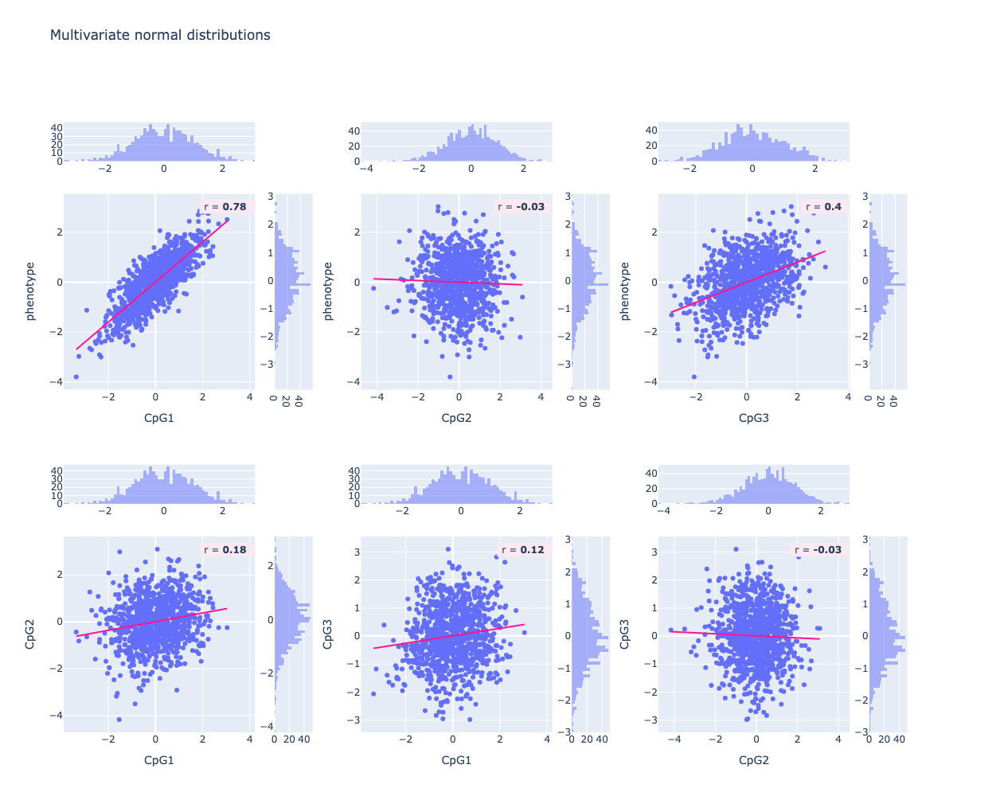

In [5]:
fig1 = pretty_scat(plot_list = [('CpG1', 'phenotype'), ('CpG2', 'phenotype'), ('CpG3', 'phenotype'), 
                                ('CpG1', 'CpG2'), ('CpG1', 'CpG3'), ('CpG2', 'CpG3')], 
                   plot_grid = (2, 3), 
                   figure_title = "Multivariate normal distributions",
                   data=norm_data)
fig1.show()

I calculate the CDF of each (normal) distribution to transform it to a uniform distribution over the interval [0, 1]. 
The *cumulative distribution function* (CDF) is defined as the integral of the probability density function (PDF) 𝑓(𝑥), which captures the likelihood that a random sample from the distribution is equal to 𝑥.

In [6]:
# Apply cumulative distribution function
unifs = dict()
for cpg in range(1,3+1):
    unifs[f'CpG{cpg}'] = norm.cdf(norm_data[f'CpG{cpg}'])

#### Example 1 
Using beta distributions (already between 0 and 1) and normalised gamma distributions

In [7]:
# Apply percent point function (inverse of cdf — percentiles).
cpg1 = pd.DataFrame(beta.ppf(unifs['CpG1'], a=0.2, b=0.1))
cpg2 = pd.DataFrame(beta.ppf(unifs['CpG2'], a=0.1, b=0.1))
cpg3 = pd.DataFrame(minmax_norm(gamma.ppf(unifs['CpG3'], a=2)))

trns_data = pd.concat([norm_data['phenotype'], cpg1, cpg2, cpg3], axis=1)
trns_data.columns=norm_data.columns

display_side_by_side(dfs=[pd.DataFrame(sim_cov, columns = var_names, index = var_names), 
                          trns_data.corr().round(2), 
                          trns_data.corr(method='spearman').round(2)], 
                     captions=['Input', 'Observed (Pearson)', 'Observed (Spearman)'])

,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.80,0.00,0.40
CpG1,0.80,1.00,0.20,0.10
CpG2,0.00,0.20,1.00,0.00
CpG3,0.40,0.10,0.00,1.00
,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.69,-0.05,0.38
CpG1,0.69,1.00,0.13,0.09
CpG2,-0.05,0.13,1.00,-0.04
CpG3,0.38,0.09,-0.04,1.00
,phenotype,CpG1,CpG2,CpG3


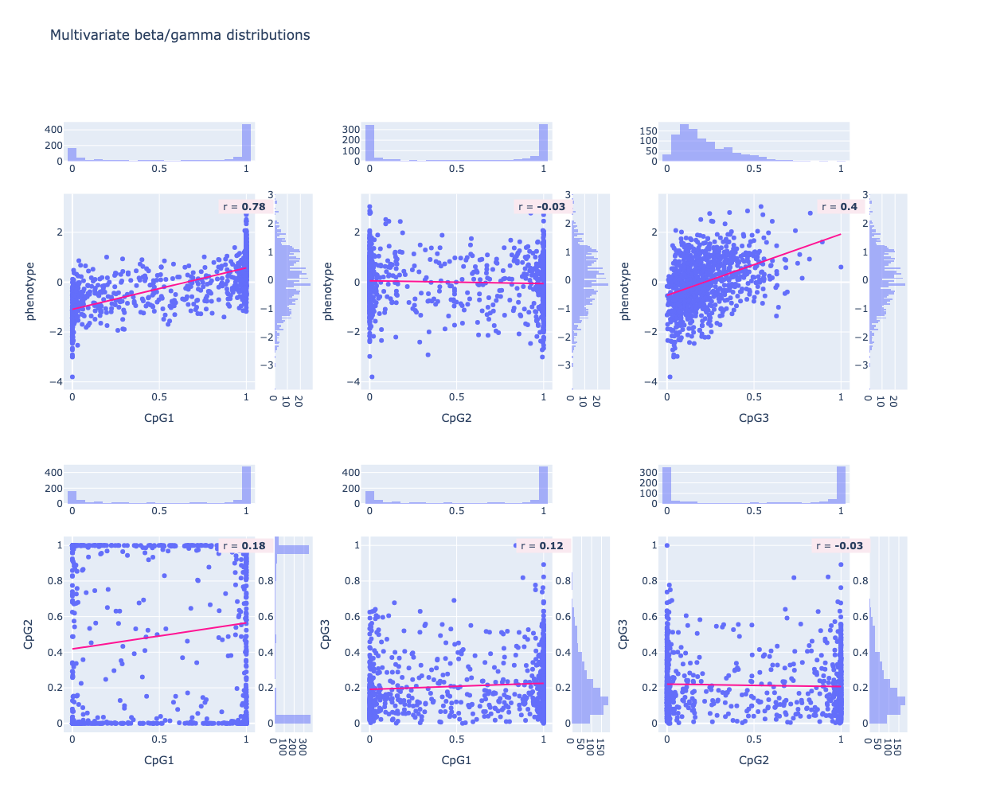

In [8]:
fig2 = pretty_scat(plot_list = [('CpG1', 'phenotype'), ('CpG2', 'phenotype'), ('CpG3', 'phenotype'), 
                                ('CpG1', 'CpG2'), ('CpG1', 'CpG3'), ('CpG2', 'CpG3')], 
                   plot_grid = (2, 3), 
                   figure_title = "Multivariate beta/gamma distributions", 
                   data=trns_data)
fig2.show()

In [9]:
class MixtureModel(rv_continuous):
    def __init__(self, submodels, *args, weights = None, **kwargs):
        super().__init__(*args, **kwargs)
        self.submodels = submodels
        if weights is None:
            weights = [1 for _ in submodels]
        if len(weights) != len(submodels):
            raise(ValueError(f'There are {len(submodels)} submodels and {len(weights)} weights, but they must be equal.'))
        self.weights = [w / sum(weights) for w in weights]
        
    def _pdf(self, x):
        pdf = self.submodels[0].pdf(x) * self.weights[0]
        for submodel, weight in zip(self.submodels[1:], self.weights[1:]):
            pdf += submodel.pdf(x)  * weight
        return pdf
            
    def _sf(self, x):
        sf = self.submodels[0].sf(x) * self.weights[0]
        for submodel, weight in zip(self.submodels[1:], self.weights[1:]):
            sf += submodel.sf(x)  * weight
        return sf

    def _cdf(self, x):
        cdf = self.submodels[0].cdf(x) * self.weights[0]
        for submodel, weight in zip(self.submodels[1:], self.weights[1:]):
            cdf += submodel.cdf(x)  * weight
        return cdf

    def rvs(self, size):
        submodel_choices = np.random.choice(len(self.submodels), size=size, p = self.weights)
        submodel_samples = [submodel.rvs(size=size) for submodel in self.submodels]
        rvs = np.choose(submodel_choices, submodel_samples)
        return rvs

mixture1 = MixtureModel([norm(.25, .005), norm(.3,.01), norm(.4, .015)], weights = [0.3, 0.4, 0.3])
mixture2 = MixtureModel([norm(-1, .5), norm(1, .5), norm(3, .8)], weights = [0.5, 0.3, 0.2])
mixture3 = MixtureModel([gamma(2), norm(6, .5)], weights = [0.5, 0.5])

In [10]:
cpg1 = pd.DataFrame(mixture1.ppf(unifs['CpG1']))
cpg2 = pd.DataFrame(minmax_norm(mixture2.ppf(unifs['CpG2'])))
cpg3 = pd.DataFrame(minmax_norm(mixture3.ppf(unifs['CpG3'])))

mxtr_data = pd.concat([norm_data['phenotype'], cpg1, cpg2, cpg3], axis=1)
mxtr_data.columns=norm_data.columns

display_side_by_side(dfs=[pd.DataFrame(sim_cov, columns = var_names, index = var_names), 
                          mxtr_data.corr().round(2), 
                          mxtr_data.corr(method='spearman').round(2)], 
                     captions=['Input', 'Observed (Pearson)', 'Observed (Spearman)'])

,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.80,0.00,0.40
CpG1,0.80,1.00,0.20,0.10
CpG2,0.00,0.20,1.00,0.00
CpG3,0.40,0.10,0.00,1.00
,phenotype,CpG1,CpG2,CpG3
phenotype,1.00,0.73,-0.04,0.39
CpG1,0.73,1.00,0.18,0.11
CpG2,-0.04,0.18,1.00,-0.03
CpG3,0.39,0.11,-0.03,1.00
,phenotype,CpG1,CpG2,CpG3


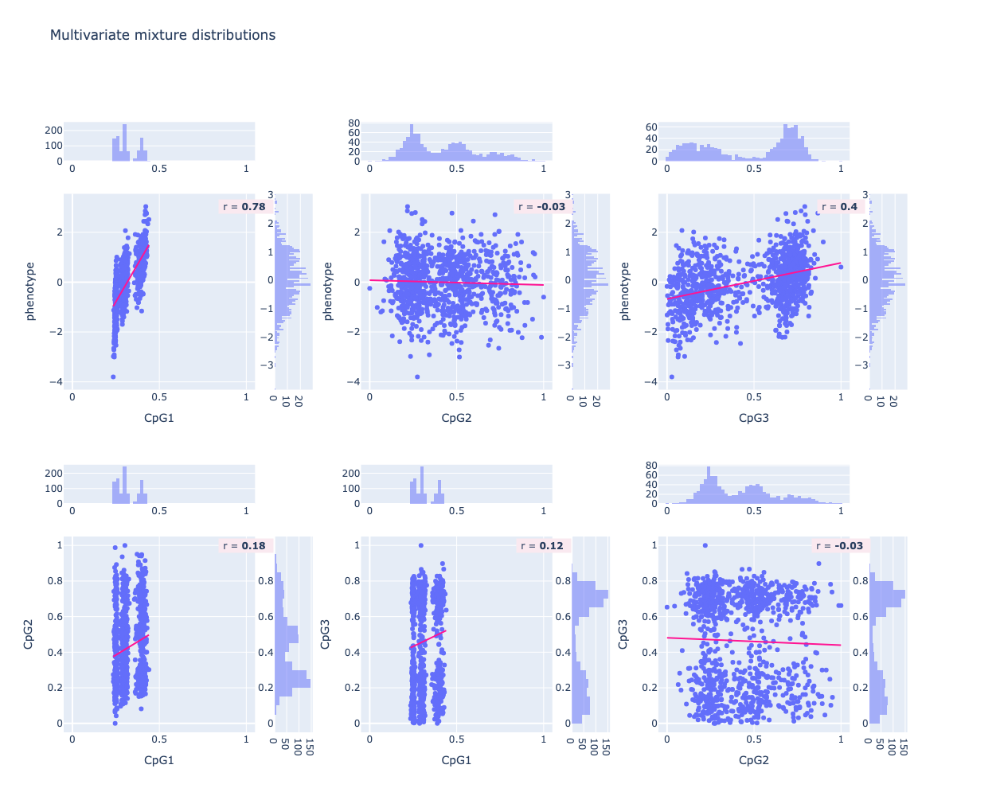

In [11]:
fig3 = pretty_scat(plot_list = [('CpG1', 'phenotype'), ('CpG2', 'phenotype'), ('CpG3', 'phenotype'), 
                                ('CpG1', 'CpG2'), ('CpG1', 'CpG3'), ('CpG2', 'CpG3')], 
                   plot_grid = (2, 3), 
                   figure_title = "Multivariate mixture distributions", 
                   data=mxtr_data)
fig3.show()

## 2. Cholesky

In [12]:
# rand_data = np.random.normal(size=(3,1000))

# pd.DataFrame(rand_data.T).corr()

# no_corr_data = pd.DataFrame(rand_data, index = ['A', 'B', 'C']).T/100

# sim_cum_rets_plot_no_corr = px.line((1+no_corr_data).cumprod(), title='Simulated data with no correlation', width=1000, height=500)
# sim_cum_rets_plot_no_corr.show()

# # Input correlations
# corr = np.array([[1, 0.7, 0.3], [0.7, 1, 0.7], [0.3, 0.7, 1]])
# corr

# # Cholesky decomposition 
# chol = np.linalg.cholesky(corr)
# chol

# np.matmul(chol, chol.T)  # corr = chol * chol.T

# sim_corr_rets = pd.DataFrame(np.matmul(chol, rand_data), index = ['A', 'B', 'C']).T/100

# sim_cum_rets_plot = px.line((1+sim_corr_rets).cumprod(), title='Simulated data with correlation', width=1000, height=500)
# sim_cum_rets_plot.show()

# sim_corr_rets.corr()

## 3. Sample from a Gaussian Mixture model 

In [13]:
# import matplotlib.pyplot as plt
# import random

# # Bivariate example
# dim = 2

# # Settings
# n = 500
# NumberOfMixtures = 3

# # Mixture weights (non-negative, sum to 1)
# w = [0.5, 0.25, 0.25]

# # Mean vectors and covariance matrices
# MeanVectors = [ [0,0], [-5,5], [5,5] ]
# CovarianceMatrices = [[[1,   0], 
#                        [0, 1]], 
                      
#                       [[1,  .8], 
#                        [.8, 1]], 
                      
#                       [[1, -.8],
#                        [-.8, 1]] ]

# # Initialize arrays
# samples = np.empty( (n,dim) ); samples[:] = np.NaN
# componentlist = np.empty( (n,1) ); componentlist[:] = np.NaN

# # Generate samples
# for iter in range(n):
#     # Get random number to select the mixture component with probability according to mixture weights
#     DrawComponent = random.choices(range(NumberOfMixtures), weights=w, cum_weights=None, k=1)[0]
#     # Draw sample from selected mixture component
#     DrawSample = np.random.multivariate_normal(MeanVectors[DrawComponent], CovarianceMatrices[DrawComponent], 1)
#     # Store results
#     componentlist[iter] = DrawComponent
#     samples[iter, :] = DrawSample

# # Report fractions
# print('Fraction of mixture component 0:', np.sum(componentlist==0)/n)
# print('Fraction of mixture component 1:',np.sum(componentlist==1)/n)
# print('Fraction of mixture component 2:',np.sum(componentlist==2)/n)

# # Visualize result
# plt.plot(samples[:, 0], samples[:, 1], '.', alpha=0.5)
# plt.grid()
# plt.show()

In [14]:
# samples